# Walmart-Sales-Time-Series-Forecasting-Using-Machine-Learning

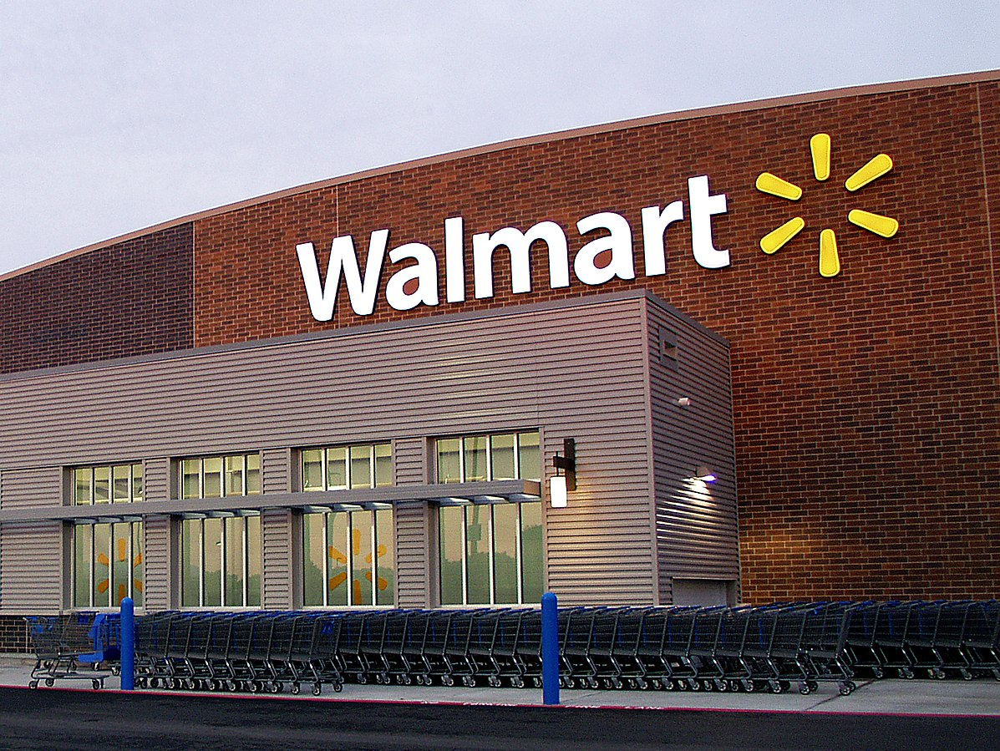

## INTRODUCTION:

* In a world where immense amounts of data are collected daily, analyzing such data is an important need, For example, large stores, such as Wal-Mart, handle hundreds of millions of transactions per week at thousands of branches around the world. In this modern world where competition is getting greater and thus making business decisionsis increasingly difficult. 
* In turn, predictingaccurately has become extremely important.Therefore, by using machine learning algorithms different domains such as retail can make informed decisions based onprojections. 
* As mention before, forecasting is of great importance to the retail business, the reason being that sales prediction is a more traditional application of forecasting. Forecasting sales incorrectly can lead to over-estimation and in turn lead to significant losses and costs of inventory holding, in turn, under-estimation of sales in aforecast can lead to loss of business opportunity.
* Exploring and analyzing the results using a machine learning model such as Random Forests, is a supervised learning algorithm which uses an ensemble learning method for classification, regression and other tasks, that functions by building a large number of decision trees at training time and producing the value that is the mode of the classes (classification) or producing the value that is the mean of the values (regression) of the individual trees.

## Table of Contents

## About Dataset

* Importing Modules
* Importing Datasets
* Visualization
* Outlier
* Data Visuallizations
* train data and test data
* Linear Regression Model
* Random Forest Regressor Model
* K Neighbors Regressor Model
* SVM (Support Vector Machine)
* Comparing Models

### Description:

One of the leading retail stores in the US, Walmart, would like to predict the sales and demand accurately. There are certain events and holidays which impact sales on each day. There are sales data available for 45 stores of Walmart. The business is facing a challenge due to unforeseen demands and runs out of stock some times, due to the inappropriate machine learning algorithm. An ideal ML algorithm will predict demand accurately and ingest factors like economic conditions including CPI, Unemployment Index, etc.

Walmart runs several promotional markdown events throughout the year. These markdowns precede prominent holidays, the four largest of all, which are the Super Bowl, Labour Day, Thanksgiving, and Christmas. The weeks including these holidays are weighted five times higher in the evaluation than non-holiday weeks. Part of the challenge presented by this competition is modeling the effects of markdowns on these holiday weeks in the absence of complete/ideal historical data. Historical sales data for 45 Walmart stores located in different regions are available.

### Acknowledgements:

The dataset is taken from Kaggle.

### Objective:

* Understand the Dataset & cleanup (if required).
* Build Regression models to predict the sales w.r.t single & multiple features.
* Also evaluate the models & compare their respective scores like R2, RMSE, etc.

## Data Exploration:

* Store : the store number
* Date : the week of sales
* Weekly_Sales : sales for the given store
* Holiday_Flag : whether the week is a special holiday week 1 - Holiday week 0 – Non-holiday week
* Temperature : Temperature on the day of sale
* Fuel_Price : Cost of fuel in the region
* CPI : Prevailing consumer price index
* Unemployment : Prevailing unemployment rate

# Importing Modules


In [1]:
import numpy as np                                    #for dealing with dataframs
import pandas as pd                                   #for scientific compution and arraies

import matplotlib.pyplot as plt                        #fro visualization
import seaborn as sns                                   #fro better visualization


from sklearn import metrics                              #for evaluating machine learning models
from sklearn.model_selection import train_test_split     #for splitting data into training and testing sets
from sklearn.linear_model import LinearRegression        #linear regression modeling
from sklearn.ensemble import RandomForestRegressor       #for random forest regression modeling
from sklearn.neighbors import KNeighborsRegressor        #for k-nearest neighbors regression modeling
from sklearn.svm import SVR                              #for support vector regression modeling

import warnings
warnings.filterwarnings('ignore')                          # ignore warning messages during execution

# **Importing Datasets**

In [2]:
data = pd.read_csv('Walmart.csv')

we read the data.

In [3]:
data.shape

(6435, 8)

returns the shape of the DataFrame data as containing the number of rows and columns.

In [4]:
data

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,28-09-2012,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,05-10-2012,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,12-10-2012,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,19-10-2012,718125.53,0,56.47,3.969,192.330854,8.667


display the data in the DataFrame.

In [5]:
data.tail()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
6430,45,28-09-2012,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,05-10-2012,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,12-10-2012,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,19-10-2012,718125.53,0,56.47,3.969,192.330854,8.667
6434,45,26-10-2012,760281.43,0,58.85,3.882,192.308899,8.667


displays the last few rows of the DataFrame.

In [6]:
data.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


displays the first few rows of the DataFrame

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


It displays the column names, data types of each column, the number of non-null values, and the memory usage.

In [8]:
data.duplicated().sum()

0

Calculates the number of duplicated rows in the DataFrame .

In [9]:
type(data)

pandas.core.frame.DataFrame

It is used to determine the type of the data.

In [10]:
data.columns

Index(['Store', 'Date', 'Weekly_Sales', 'Holiday_Flag', 'Temperature',
       'Fuel_Price', 'CPI', 'Unemployment'],
      dtype='object')

Returns a list of column names in the DataFrame .

In [11]:
data.dtypes

Store             int64
Date             object
Weekly_Sales    float64
Holiday_Flag      int64
Temperature     float64
Fuel_Price      float64
CPI             float64
Unemployment    float64
dtype: object

It is used to retrieve the data types of each column in the DataFrame.

In [12]:
data.isnull()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...
6430,False,False,False,False,False,False,False,False
6431,False,False,False,False,False,False,False,False
6432,False,False,False,False,False,False,False,False
6433,False,False,False,False,False,False,False,False


It is used to check for missing values in the DataFrame data. It returns a DataFrame of the same shape as data, where each element is either True if it is a missing value (NaN) or False if it is not.

In [13]:
data.isnull().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

It will display the count of missing values in each column of the DataFrame .

In [14]:
data.nunique()

Store             45
Date             143
Weekly_Sales    6435
Holiday_Flag       2
Temperature     3528
Fuel_Price       892
CPI             2145
Unemployment     349
dtype: int64

It will display the number of unique values in each column of the DataFrame.

In [15]:
data.describe()      #summary statistics

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000000,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151
std,12.988182,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885
min,1.000000,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000
25%,12.000000,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000
50%,23.000000,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000
75%,34.000000,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000
max,45.000000,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000


It will display the statistical summary of the DataFrame .

# VISUALIZATION

### Heatmap:

heatmap function from the seaborn library.This function allows you to visualize the correlation between different variables in a tabular dataset.The annot=True argument adds annotations to the heatmap to display the correlation values.

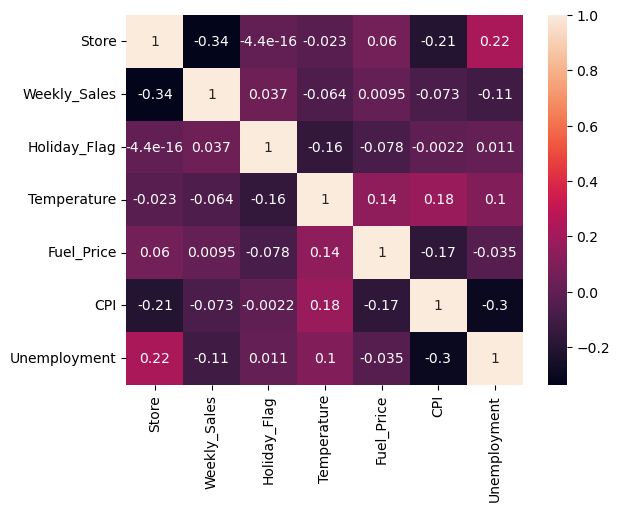

In [16]:
sns.heatmap(data.corr(),annot=True)
plt.show()                                 

### Line plot:

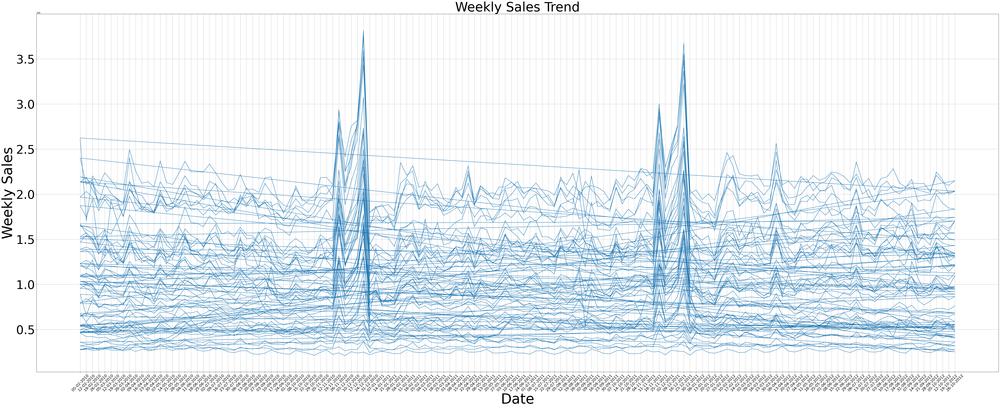

In [17]:
plt.figure(figsize=(80, 30))
plt.plot(data['Date'], data['Weekly_Sales'])
plt.xlabel('Date',fontsize=65)
plt.ylabel('Weekly Sales',fontsize=65)
plt.title('Weekly Sales Trend',fontsize=60)
plt.xticks(rotation=45,fontsize=18)
plt.yticks(fontsize=55)
plt.grid(True)
plt.show()


Line plot function from the matplotlib library.This function allows you to visualize the trend or relationship between variables over a continuous axis. It sets the x-axis as the 'Date' column and the y-axis as the 'Weekly_Sales' column from the dataset.

### Box plot:

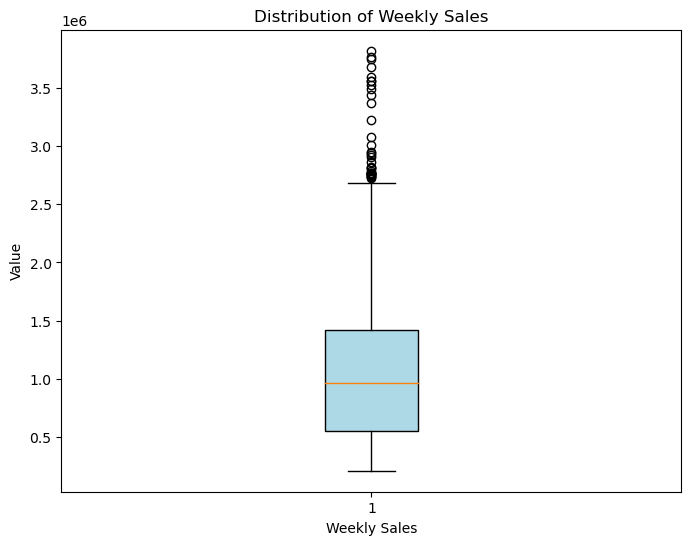

In [18]:
#box plot
plt.figure(figsize=(8, 6))
plt.boxplot(data['Weekly_Sales'],patch_artist=True, boxprops=dict(facecolor='lightblue'))
plt.xlabel('Weekly Sales')
plt.ylabel('Value')
plt.title('Distribution of Weekly Sales')
plt.show()


It is a graphical representation of the distribution of a dataset.They help identify potential outliers and provide a quick overview of the data distribution.

### Histogram:

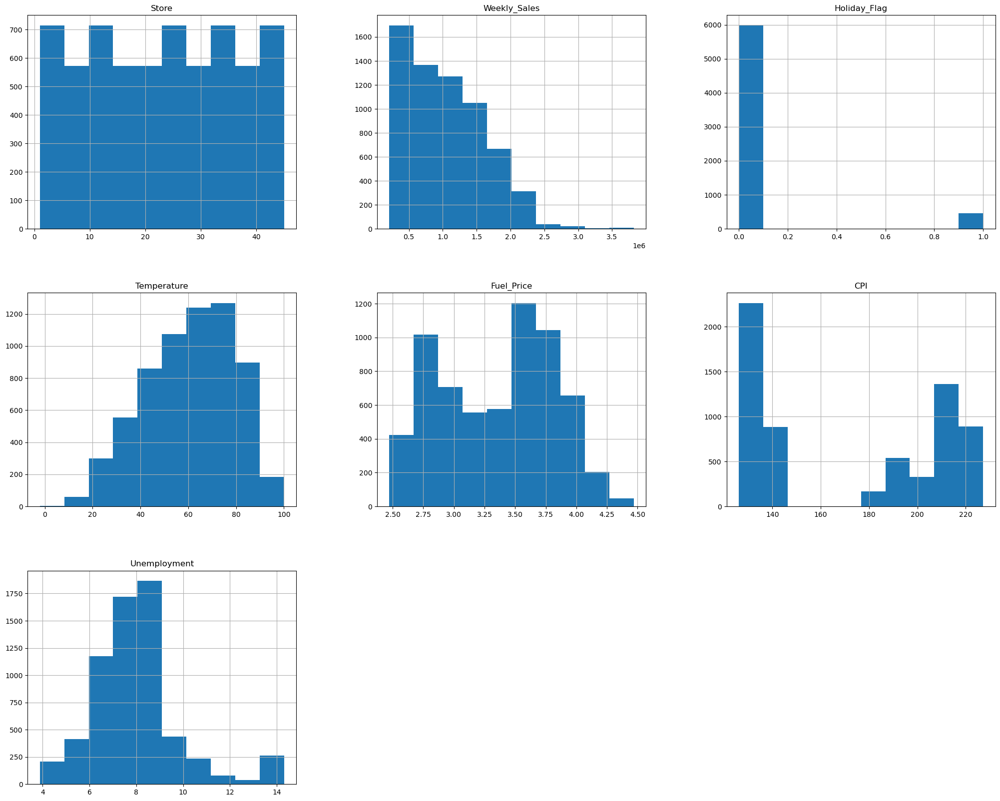

In [19]:
#histogram
data.hist(figsize=(25,20));

The hist() function in matplotlib is used to create a histogram, which is a graphical representation of the distribution of a dataset. It displays the frequency or count of values within specific intervals, also known as bins

### Pairplot:

<Figure size 1400x1400 with 0 Axes>

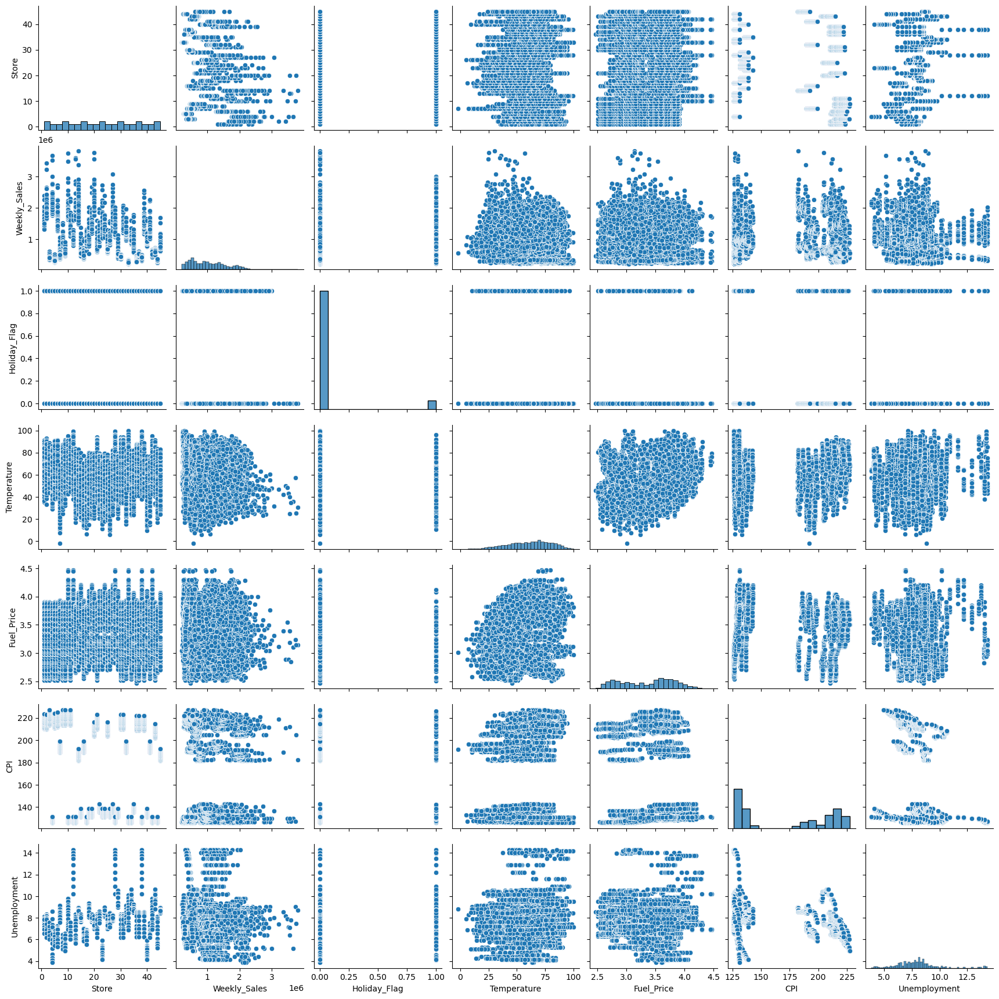

In [20]:
plt.figure(figsize = (14,14))
sns.pairplot(data)
plt.show()

A pair plot is a visualization technique that allows you to see the pairwise relationships between multiple variables in a dataset.pairplot() function from the seaborn library.

# **Splitting Date Column**

In [21]:
# Convert 'Date' column to datetime format
data['Date'] = pd.to_datetime(data['Date'])

# Extract day, month, and year
data['Day'] = data['Date'].dt.day
data['Month'] = data['Date'].dt.month
data['Year'] = data['Date'].dt.year

# Optional: Convert the Day and Month columns to integers (if needed)
data['Day'] = data['Day'].astype(int)
data['Month'] = data['Month'].astype(int)

# Optional: Drop the original Date column if no longer needed
data.drop('Date', axis=1, inplace=True)


By performing these operations, you have extracted the day, month, and year information from the 'Date' column and created separate columns for each component.

In [22]:
data.head()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Day,Month,Year
0,1,1643690.90,0,42.31,2.572,211.096358,8.106,2,5,2010
1,1,1641957.44,1,38.51,2.548,211.242170,8.106,2,12,2010
2,1,1611968.17,0,39.93,2.514,211.289143,8.106,19,2,2010
3,1,1409727.59,0,46.63,2.561,211.319643,8.106,26,2,2010
4,1,1554806.68,0,46.50,2.625,211.350143,8.106,3,5,2010


# outlier

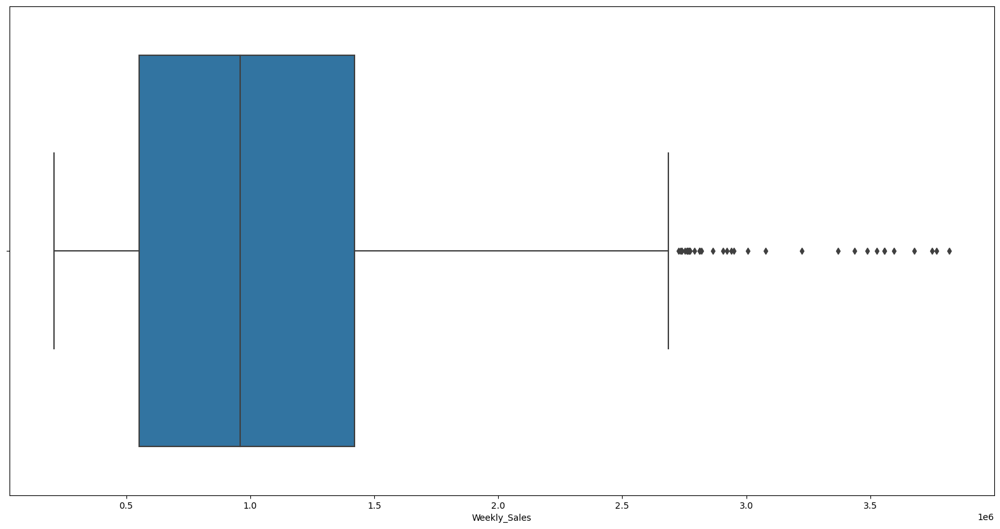

In [23]:
plt.figure(figsize=(20,10))
sns.boxplot(data=data, x='Weekly_Sales') 
plt.show()

In [24]:
df_outliers=data[data['Weekly_Sales']>=2650000]

In [25]:
df_outliers.shape

(37, 10)

In [26]:
df=data[~(data['Weekly_Sales']>=2650000 )]   ##Destructor

In [27]:
df.shape

(6398, 10)

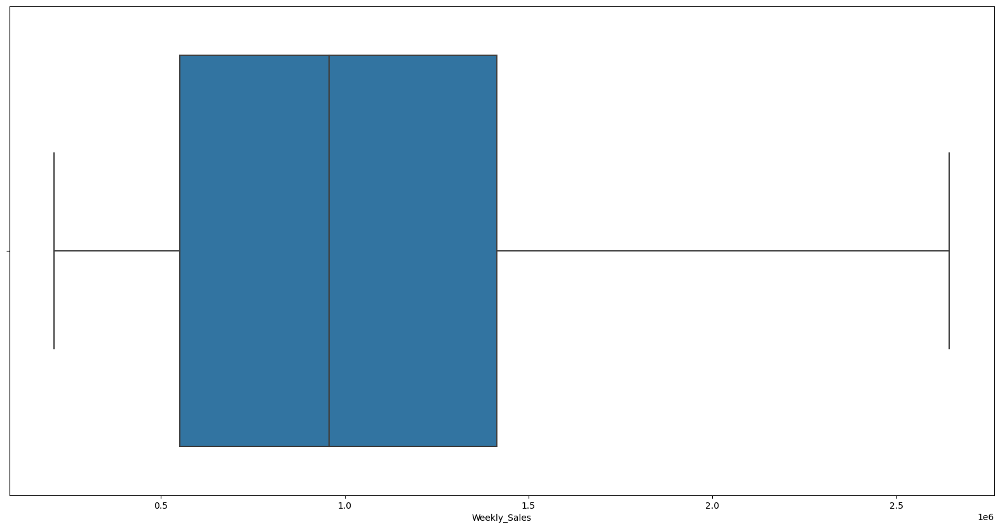

In [28]:
plt.figure(figsize=(20,10))
sns.boxplot(data=df, x='Weekly_Sales') 
plt.show()

# **Data Visuallizations**

**Average Monthly Sales**

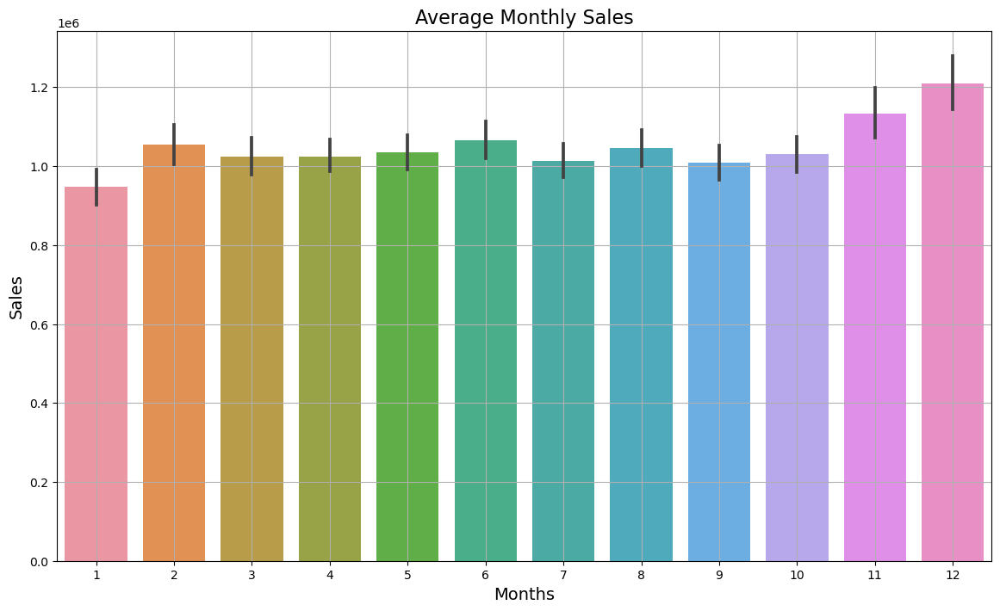

In [29]:
plt.figure(figsize=(14,8))
sns.barplot(x='Month',y='Weekly_Sales',data=data)
plt.ylabel('Sales',fontsize=14)
plt.xlabel('Months',fontsize=14)
plt.title('Average Monthly Sales',fontsize=16)
plt.grid()

**Monthly Sales for Each Year**

In [30]:
data_monthly = pd.crosstab(data["Year"], data["Month"], values=data["Weekly_Sales"],aggfunc='sum')
data_monthly

Month,1,2,3,4,5,6,7,8,9,10,11,12
Year,,,,,,,,,,,,
2010,4.223988e+07,1.915869e+08,1.862262e+08,1.838118e+08,2.806119e+08,1.424361e+08,1.842664e+08,1.845381e+08,1.797041e+08,2.311201e+08,1.587731e+08,3.235716e+08
2011,2.119657e+08,1.876092e+08,1.365205e+08,2.789693e+08,1.828017e+08,1.401936e+08,2.244611e+08,1.880810e+08,2.310323e+08,1.837193e+08,2.534703e+08,2.293760e+08
2012,1.722207e+08,1.428296e+08,2.307397e+08,1.825428e+08,1.422830e+08,2.923883e+08,1.845865e+08,1.916126e+08,1.797959e+08,1.880794e+08,4.692588e+07,4.612851e+07


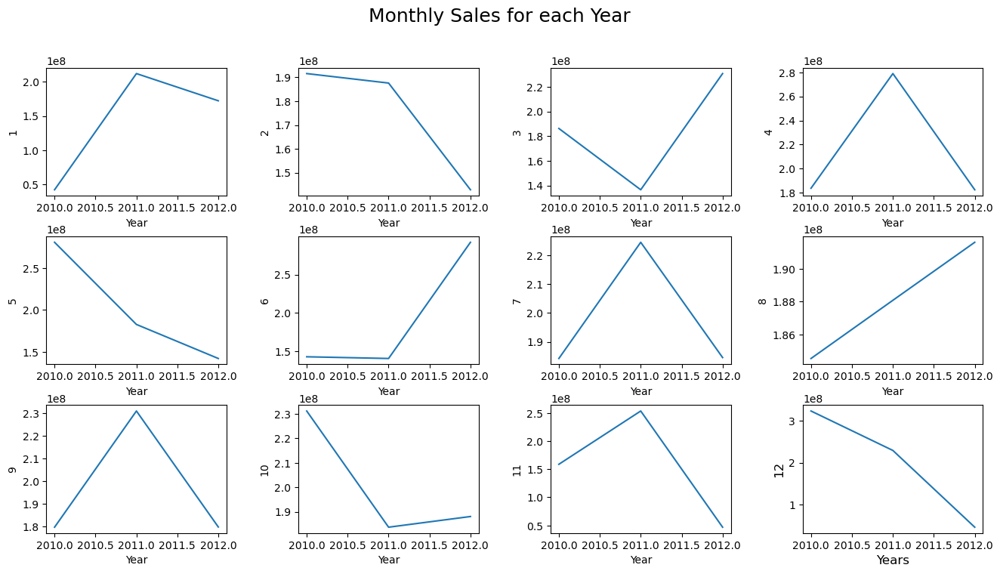

In [31]:
fig, axes = plt.subplots(3,4,figsize=(16,8))
plt.suptitle('Monthly Sales for each Year', fontsize=18)
k=1
for i in range(3):  # Iterates over the rows of the grid.
    for j in range(4):   #Iterates over the columns of the grid.
      sns.lineplot(ax=axes[i,j],data=data_monthly[k])  # Each subplot will have its own line plot.
      plt.subplots_adjust(wspace=0.4,hspace=0.32) #adjust specing, wspace sets the horizontal spacing, and hspace sets 
      plt.ylabel(k,fontsize=12) #This sets the y-axis label for the current subplot as the value of k
      plt.xlabel('Years',fontsize=12) #This sets the x-axis label for the current subplot as 'Years'.
      k+=1  #This increments the value of k by 1, ensuring that the next subplot will use the next element from data_monthly.

plt.show()

**Average Weekly Sales Store wise**

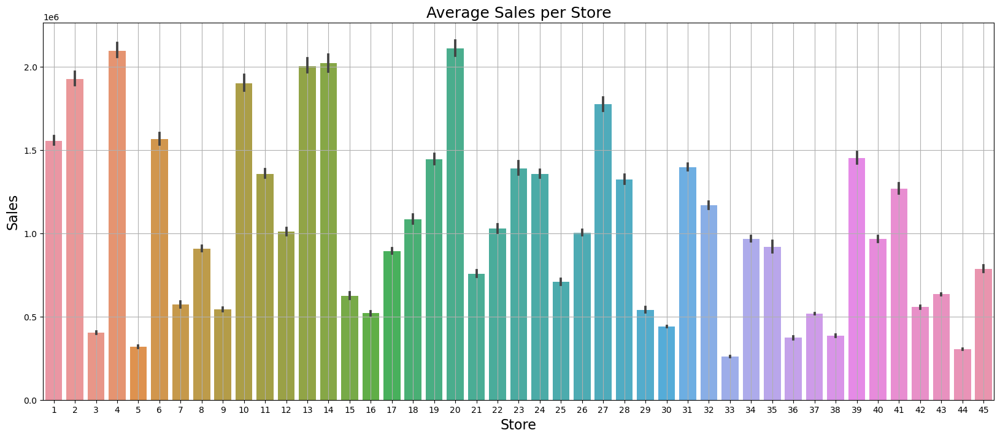

In [32]:
plt.figure(figsize=(20,8))
sns.barplot(x='Store',y='Weekly_Sales',data=data)
plt.grid()
plt.title('Average Sales per Store', fontsize=18)
plt.ylabel('Sales', fontsize=16)
plt.xlabel('Store', fontsize=16)
plt.show()

**Sales Vs Temperature**

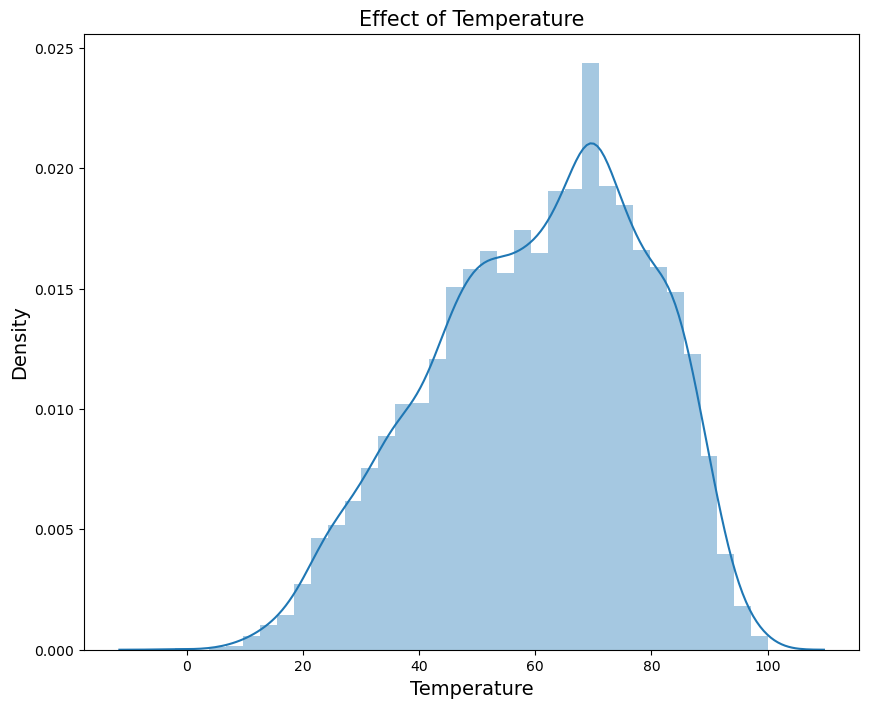

In [33]:
plt.figure(figsize=(10,8))
sns.distplot(data['Temperature'])
plt.title('Effect of Temperature',fontsize=15)
plt.xlabel('Temperature',fontsize=14)
plt.ylabel('Density',fontsize=14)
plt.show()

**Holiday Distribution**

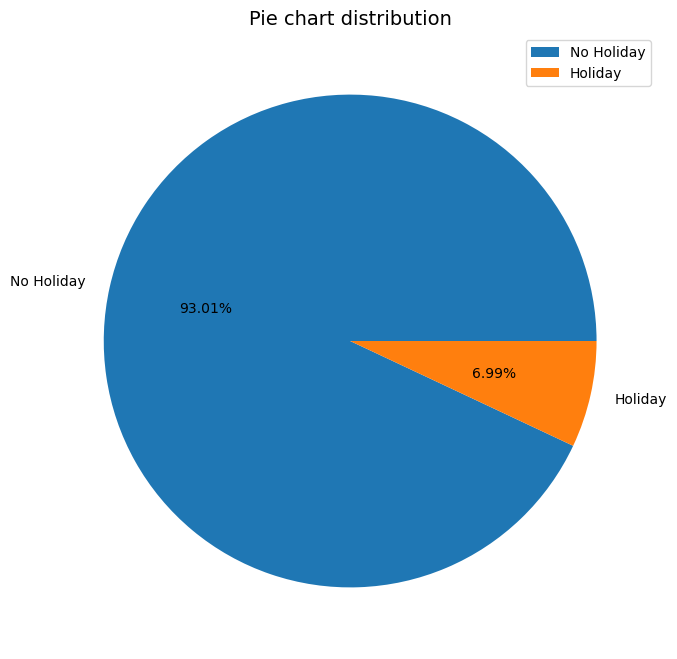

In [34]:
plt.figure(figsize=(8,8))
plt.pie(data['Holiday_Flag'].value_counts(),labels=['No Holiday','Holiday'],autopct='%0.2f%%')
plt.title("Pie chart distribution",fontsize=14)
plt.legend()
plt.show()

# train data and test data

In [35]:
X = data.drop(['Weekly_Sales'],axis=1)
Y = data.Weekly_Sales
     

In [36]:
from sklearn.model_selection import train_test_split

In [37]:
X_train,X_test,y_train,y_test = train_test_split(X,Y,test_size=0.20, random_state=50)

In [38]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(5148, 9)
(1287, 9)
(5148,)
(1287,)


# **Linear Regression Model**

Linear Regression is a supervised learning algorithm that establishes a linear relationship between input variables and a continuous target variable. It predicts the target variable's value based on the coefficients of the linear equation and making it suitable for simple regression tasks.

In [39]:
lr = LinearRegression(normalize=False)
lr.fit(X_train, y_train)

LinearRegression(normalize=False)

In [40]:
lr_acc = lr.score(X_train,y_train)*100
print("Linear Regressor Accuracy - ",lr_acc)

Linear Regressor Accuracy -  14.877842595369128


In [41]:
lr_acc = lr.score(X_test,y_test)*100
print("Linear Regressor Accuracy - ",lr_acc)

Linear Regressor Accuracy -  13.90254512575908


In [42]:
y_pred = lr.predict(X_test)

In [43]:
print("MAE" , metrics.mean_absolute_error(y_test, y_pred))
print("MSE" , metrics.mean_squared_error(y_test, y_pred))
print("RMSE" , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print("R2" , metrics.explained_variance_score(y_test, y_pred))

MAE 434927.2381816333
MSE 271402241219.45648
RMSE 520962.80214565847
R2 0.1390328682183486


In [44]:
lr_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
lr_df

,Actual,Predicted
559,2174514.13,1.421495e+06
5825,1238844.56,8.215892e+05
6275,358461.58,8.336944e+05
1316,1727565.42,1.291499e+06
2291,749549.55,1.249850e+06
...,...,...
93,1539483.70,1.324913e+06
5768,1153596.53,7.834125e+05
3612,916522.66,1.143306e+06
893,480239.88,1.262334e+06


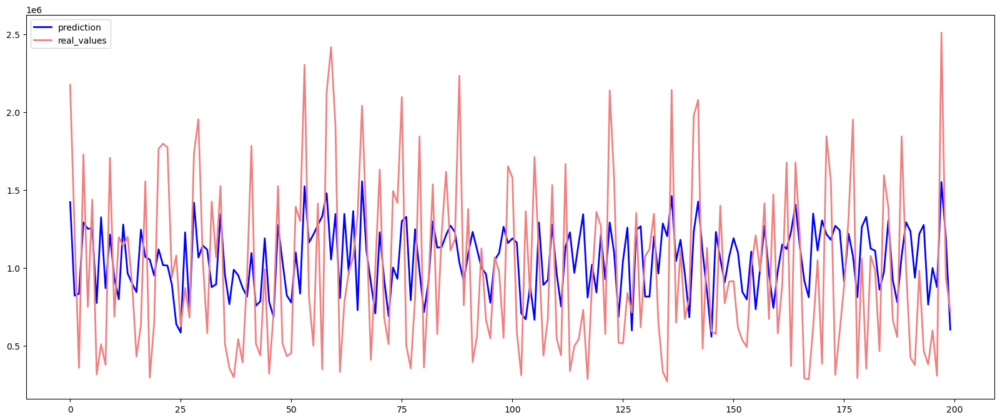

In [45]:
plt.figure(figsize=(20,8))
plt.plot(lr.predict(X_test[:200]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[:200].values, label="real_values", linewidth=2.0,color='lightcoral')
plt.legend(loc="best")
plt.show()
     

# **Random Forest Regressor Model**

* Random Forest is a supervised learning algorithm. It falls under the category of supervised machine learning because it requires labeled training data, where the input features and their corresponding output labels are provided during the training phase. The algorithm learns from this labeled data to make predictions or classify new, unseen instances.
* combines multiple decision trees to improve the accuracy of the predictions in supervised classification and regression tasks.

In [46]:
rf = RandomForestRegressor()
rf.fit(X_train, y_train)

RandomForestRegressor()

In [47]:
rf_acc = rf.score(X_train,y_train)*100
print("Random Forest Regressor Accuracy - ",rf_acc)

Random Forest Regressor Accuracy -  99.36982736445412


In [48]:
rf_acc = rf.score(X_test,y_test)*100
print("Random Forest Regressor Accuracy - ",rf_acc)

Random Forest Regressor Accuracy -  95.68986983531572


In [49]:
y_pred = rf.predict(X_test)

In [50]:
print("MAE" , metrics.mean_absolute_error(y_test, y_pred))
print("MSE" , metrics.mean_squared_error(y_test, y_pred))
print("RMSE" , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print("R2" , metrics.explained_variance_score(y_test, y_pred))

MAE 64567.095352758384
MSE 13586684860.215052
RMSE 116561.93572609822
R2 0.9569930355383776


In [51]:
rf_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
rf_df

,Actual,Predicted
559,2174514.13,2.185372e+06
5825,1238844.56,1.478753e+06
6275,358461.58,3.301398e+05
1316,1727565.42,1.874555e+06
2291,749549.55,8.299593e+05
...,...,...
93,1539483.70,1.644532e+06
5768,1153596.53,1.204580e+06
3612,916522.66,9.170752e+05
893,480239.88,4.722062e+05


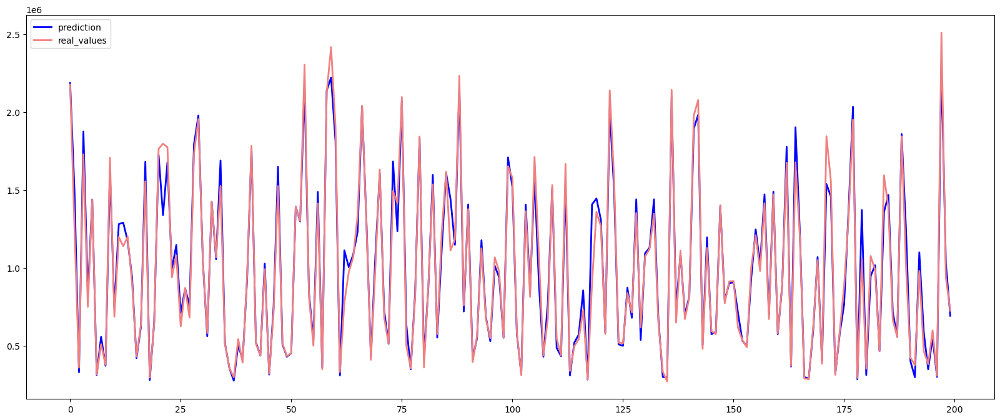

In [52]:
plt.figure(figsize=(20,8))
plt.plot(rf.predict(X_test[:200]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[:200].values, label="real_values", linewidth=2.0,color='lightcoral')
plt.legend(loc="best")
plt.show()

# **K Neighbors Regressor Model**

K Neighbors Regressor is a supervised learning algorithm that predicts continuous numerical values based on the average of the values of its k nearest neighbors in the feature space, making it useful for regression tasks where nearby data points have similar outputs.

In [53]:
knn = KNeighborsRegressor(n_neighbors = 1,weights = 'uniform')
knn.fit(X_train,y_train)

KNeighborsRegressor(n_neighbors=1)

In [54]:
knn_acc = knn.score(X_train, y_train)*100
print("KNeigbhbors Regressor Accuracy - ",knn_acc)

KNeigbhbors Regressor Accuracy -  100.0


In [55]:
knn_acc = knn.score(X_test, y_test)*100
print("KNeigbhbors Regressor Accuracy - ",knn_acc)

KNeigbhbors Regressor Accuracy -  4.682096747721687


In [56]:
y_pred = knn.predict(X_test)

In [57]:
print("MAE" , metrics.mean_absolute_error(y_test, y_pred))
print("MSE" , metrics.mean_squared_error(y_test, y_pred))
print("RMSE" , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print("R2" , metrics.explained_variance_score(y_test, y_pred))

MAE 339797.3507925408
MSE 300467564445.3623
RMSE 548149.2173171118
R2 0.04797583415711526


In [58]:
knn_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
knn_df

,Actual,Predicted
559,2174514.13,2160057.39
5825,1238844.56,1150003.36
6275,358461.58,342385.38
1316,1727565.42,1832664.03
2291,749549.55,736335.69
...,...,...
93,1539483.70,1902762.50
5768,1153596.53,1150003.36
3612,916522.66,901972.70
893,480239.88,525866.36


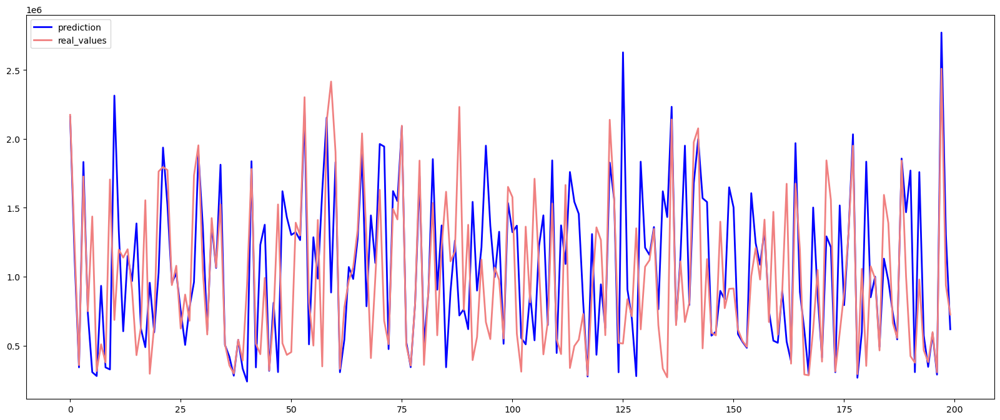

In [59]:
plt.figure(figsize=(20,8))
plt.plot(knn.predict(X_test[:200]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[:200].values, label="real_values", linewidth=2.0,color='lightcoral')
plt.legend(loc="best")

plt.show()

# SVM (Support Vector Machine)

SVM (Support Vector Machine) is a supervised learning algorithm that separates data into different classes by finding an optimal hyperplane in a high-dimensional feature space, allowing it to handle complex classification tasks with a clear margin between classes.

In [60]:
from sklearn.svm import SVR
# Assuming you have a feature matrix X and target variable y
svr = SVR(kernel='linear')
svr.fit(X_train, y_train)

SVR(kernel='linear')

In [61]:
# Make predictions on the test set
y_pred = svr.predict(X_test)


In [62]:
svm_acc = svr.score(X_train, y_train)*100
print("accuracy:", svm_acc)


accuracy: 5.613595160788076


In [63]:
# Calculate the accuracy of the model
svm_acc = svr.score(X_test, y_test)*100
print("accuracy:", svm_acc)


accuracy: 4.989217691322201


In [64]:
print("MAE" , metrics.mean_absolute_error(y_test, y_pred))
print("MSE" , metrics.mean_squared_error(y_test, y_pred))
print("RMSE" , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print("R2" , metrics.explained_variance_score(y_test, y_pred))

MAE 441243.83655057556
MSE 299499436960.75354
RMSE 547265.4172892286
R2 0.09629817452300016


In [65]:
svm_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
svm_df

,Actual,Predicted
559,2174514.13,1.176575e+06
5825,1238844.56,7.651915e+05
6275,358461.58,8.646280e+05
1316,1727565.42,1.121471e+06
2291,749549.55,1.118897e+06
...,...,...
93,1539483.70,9.806346e+05
5768,1153596.53,7.767778e+05
3612,916522.66,1.021561e+06
893,480239.88,1.022606e+06


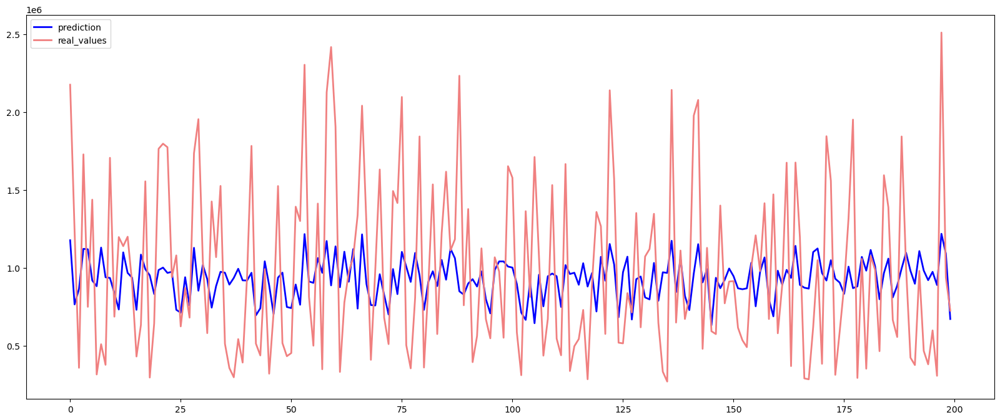

In [66]:
plt.figure(figsize=(20,8))
plt.plot(svr.predict(X_test[:200]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[:200].values, label="real_values", linewidth=2.0,color='lightcoral')
plt.legend(loc="best")

plt.show()

## Observation:

* Based on the accuracy scores,the Random Forest model is the best choice for predicting sales forecasting.The Random Forest model has a train accuray of 99.38% ana a test accuracy of 95.62% .This means that the model is able to accurately predict claims when it is trained on data and when it is tested on new data.
* Overall,the Random Forest model is the best choice for predicting Sales-Time-Series-Forecasting because it has heighest accuracy.

# Comparing Models

In [67]:
acc = {'model':['lr_acc','rf_acc','knn_acc','svm_acc'],'accuracy':[lr_acc,rf_acc,knn_acc,svm_acc]}

In [68]:
acc_df = pd.DataFrame(acc)
acc_df

,model,accuracy
0,lr_acc,13.902545
1,rf_acc,95.689870
2,knn_acc,4.682097
3,svm_acc,4.989218


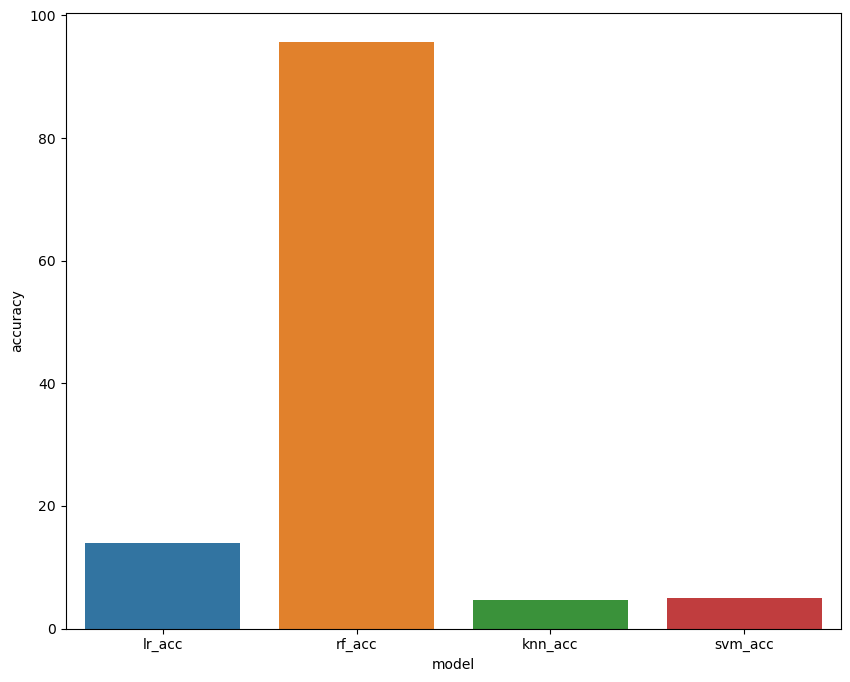

In [69]:
plt.figure(figsize=(10,8))
sns.barplot(x='model',y='accuracy',data=acc_df)
plt.show()

## CONCLUSION:

* This research dealt with the implementation data mining techniques and machine learning algorithms on the Walmart dataset and analysis was
made to determine the accuracy of the algorithm, model and forecast. Random Forest is found to be a good model to forecast sales data for its
performance on weighted variables such as dollars.
* Therefore, being a valuable asset to be applied on forecasting sales on the retail industry. It is important to mention that to produce highly
accurate predictions with the tiniest of details, more models with larger hyperparameters set could be apply in conjunction with better hardware
electronics such as Graphic Procession Units because this is a computationally expensive taskand with bigger datasets, it can take hours to train
and have a result.
* This study shows how efficient and impactful is the use of data science and machine learning to forecast sales and how any organization could
benefit from valuable insight that leads to an informed and better decision making process.